# **CAMPUS PARTY - EDITION**
- [ ] Ajustar os imports
- [ ] Modelos no torch
- [ ] Avaliação e distribuição estatística dos dados
- [ ] Declarar o ensemble
- [ ] Treinamento do ensemble


# Download dependencies and data

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/kaggle'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!kaggle datasets download -d kmader/parkinsons-drawings

Dataset URL: https://www.kaggle.com/datasets/kmader/parkinsons-drawings
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
parkinsons-drawings.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile

file_path = '/content/parkinsons-drawings.zip'

with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('/content/drive/MyDrive/kaggle')


# Imports and local API

In [ ]:
import numpy as np
import glob
import cv2
import ntpath
import matplotlib.pyplot as plt
import random
import time
from tabulate import tabulate, tabulate_formats

import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, AveragePooling2D
from tensorflow.keras.layers import Concatenate, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import DenseNet121, ResNet50, VGG16

from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
from sklearn.utils import shuffle

# Verificando se a GPU está ativa
print('GPUs available:',len(tf.config.list_physical_devices('GPU')))

GPUs available: 1


## Funções de manipulação dos dados

In [ ]:
from typing import Tuple

def baseDir(path):
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)


def loadData(X_data, y_data, path):
  files = glob.glob(f"{path}/*.png")
  dirname = baseDir(path)

  for img in files:
    # print(myFile)
    image = cv2.imread(img)
    X_data.append(image)
    if dirname == 'healthy': y_data.append(0)
    else: y_data.append(1)

  return X_data, y_data

## Funções de formatação de dados

In [ ]:
def resize_with_padding(data, exp_shape):
  for i in range(len(data)):
    img = data[i]
    img_shape = [img.shape[1], img.shape[0]]
    if img_shape != exp_shape:
      ratio = max(exp_shape)/max(img_shape)
      new_size = tuple([int(x*ratio) for x in img_shape])
      img = cv2.resize(img, new_size)
      delta_w = exp_shape[0] - new_size[0]
      delta_h = exp_shape[1] - new_size[1]
      top, bottom = delta_h//2, delta_h-(delta_h//2)
      left, right = delta_w//2, delta_w-(delta_w//2)
      img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(255,255,255))
      data[i] = img

  return data


def resize(data, exp_shape):
  for img in data:
    if img.shape != exp_shape:
      img = cv2.resize(img, exp_shape, interpolation=cv2.INTER_AREA)

  return data


def segment(data):
  for n in range(len(data)):
    img = data[n]
    tresh = np.percentile(img, 5)

    for i in range(len(img)):
      for j in range(len(img[0])):
        for c in range(len(img[0][0])):
          if img[i][j][c] < tresh:
            img[i][j][c] = 0
          else:
            img[i][j][c] = 255
          data[n] = img

  data = resize_with_padding(data, [256,256])

  return data

## Funções de data augmentation

In [ ]:
def augment(data, label):
  for n in range(len(data)):
    img = data[n]
    data.append(cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE))
    label.append(label[n])
    data.append(cv2.rotate(img, cv2.ROTATE_180))
    label.append(label[n])
    data.append(cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE))
    label.append(label[n])
    flip = cv2.flip(img, 1)
    data.append(flip)
    label.append(label[n])
    data.append(cv2.rotate(flip, cv2.ROTATE_90_CLOCKWISE))
    label.append(label[n])
    data.append(cv2.rotate(flip, cv2.ROTATE_180))
    label.append(label[n])
    data.append(cv2.rotate(flip, cv2.ROTATE_90_COUNTERCLOCKWISE))
    label.append(label[n])

  return data, label

## Funções de plot

In [ ]:
def countClasses(data, classes):
  cnt = []
  for i in range(len(classes)):
    cnt.append(data.count(classes[i]))

  return cnt


def plotSamples(data, title):
  x = 0; y = 0
  samp = random.sample(data, 5)
  fig1, axs1 = plt.subplots(nrows=1, ncols=5)
  fig1.suptitle(title, y=0.65)
  for img in samp:
    axs1[x].imshow(img)
    axs1[x].axis('off')
    x = x+1
  samp = random.sample(data, 5)
  fig2, axs2 = plt.subplots(nrows=1, ncols=5)
  for img in samp:
    axs2[y].imshow(img)
    axs2[y].axis('off')
    y = y+1
  plt.show()

def plotMisclassed(X_test, y_test, model):
  errors = []

  pred_y = np.argmax(model.predict(X_test), axis=-1)
  for i in range(pred_y.shape[0]):
    errors.append(int(pred_y[i] != y_test[i]))

  for i in range(len(errors)):
    if errors[i] == 1:
      label = 'Parkinson' if pred_y[i] == 1 else 'Healthy'
      plt.imshow(X_pd_test[i])
      plt.axis('off')
      plt.title(f'Wrong prediction: {label}')
      plt.show()

## Funções de inferência dos modelos

In [ ]:
# Função de treino dos modelos de deep learning
def train_dl_model(model, name, train_X, train_y):

  # Callback para salvar o melhor modelo durante o treinamento
  checkpoint = callbacks.ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_accuracy', verbose=0)
  early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

  # Compilando o modelo
  model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

  # Treinamento do modelo
  start_time = time.time()
  history = model.fit(
    train_X, train_y,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    callbacks=[checkpoint,early_stopping]
  )
  end_time = time.time()

  # Calcular tempo de execução
  exec_time = end_time - start_time
  print(f'\nTempo de execução do {name} em segundos: {np.round(exec_time,2)}')

  # Plotar gráfico de acurácia durante o treino
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  ax = plt.gca()
  ax.set_ylim([0,1])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['Train', 'Validation'])
  plt.show()

  # Plotar gráfico de custo durante o treino
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  ax = plt.gca()
  ax.set_ylim([0,1])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['Train', 'Validation'])
  plt.show()

  # Salvando os dados do modelo
  model_list.append(name)
  exec_times.append(np.round(exec_time,2))


# Função de avaliação de modelos deep learning
def evaluate_dl_model(model, name, test_X, test_y, labels):

  # Avaliação do modelo no conjunto de teste
  test_loss, test_acc = model.evaluate(test_X, test_y)
  print(f'{name} Test Accuracy: {np.round(test_acc,4)}, {name} Test Loss: {np.round(test_loss,4)}\n')

  # Fazendo a classificação do conjunto de testes
  pred_y = np.argmax(model.predict(test_X), axis=1)

  # Medindo a acurácia do modelo
  accuracy = accuracy_score(test_y, pred_y)

  # Relatório de classificação do modelo
  print(f"\nClassification Report do {name}")
  print(classification_report(test_y, pred_y))

  # Definindo a matriz de confusão
  cm = confusion_matrix(test_y, pred_y)

  # Calculando a TPR
  TPR = cm.diagonal()/cm.sum(axis=1)
  print(f'\nTPR por classe do {name}:',np.round(TPR,4))

  # Exibindo a matriz de confusão
  print('\nConfusion Matrix')
  ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels).plot();
  plt.show()

  preds = [prob[1] for prob in model.predict(test_X)]
  auc = roc_auc_score(test_y, preds)
  fpr, tpr, _ = roc_curve(test_y, preds, pos_label=1)

  print('\nCurva AUC-ROC')
  RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name=name, pos_label=1).plot()
  plt.show()

  # Adicionando os dados do modelo aos vetores de resultado
  accuracies.append(np.round(accuracy,4))

## Variáveis globais

In [ ]:
# Predefinindo arrays de resultado
model_list = []
exec_times = []
accuracies = []
datasets = ['rgb_pd','rgb_rs','seg']
labels = ['healthy', 'parkinson']

# Processing data

In [ ]:
X_train = []; X_test = []
y_train = []; y_test = []

X_train, y_train = loadData(X_train, y_train, "/content/drive/MyDrive/kaggle/spiral/training/healthy")
X_train, y_train = loadData(X_train, y_train, "/content/drive/MyDrive/kaggle/spiral/training/parkinson")
X_train, y_train = loadData(X_train, y_train, "/content/drive/MyDrive/kaggle/wave/training/healthy")
X_train, y_train = loadData(X_train, y_train, "/content/drive/MyDrive/kaggle/wave/training/parkinson")

X_test, y_test = loadData(X_test, y_test, "/content/drive/MyDrive/kaggle/spiral/testing/healthy")
X_test, y_test = loadData(X_test, y_test, "/content/drive/MyDrive/kaggle/spiral/testing/parkinson")
X_test, y_test = loadData(X_test, y_test, "/content/drive/MyDrive/kaggle/wave/testing/healthy")
X_test, y_test = loadData(X_test, y_test, "/content/drive/MyDrive/kaggle/wave/testing/parkinson")

print('train data size:',len(X_train),len(y_train))
print('test data size:',len(X_test), len(y_test))

train data size: 144 144
test data size: 60 60


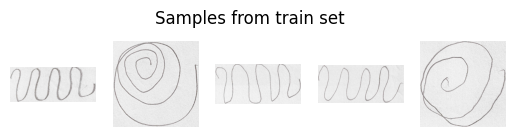

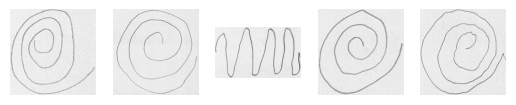

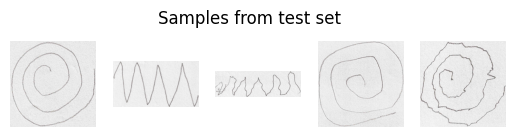

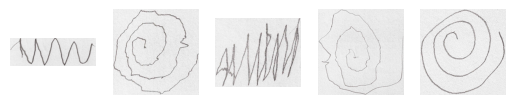

In [ ]:
title = "Samples from train set"
plotSamples(X_train, title)
title = "Samples from test set"
plotSamples(X_test, title)

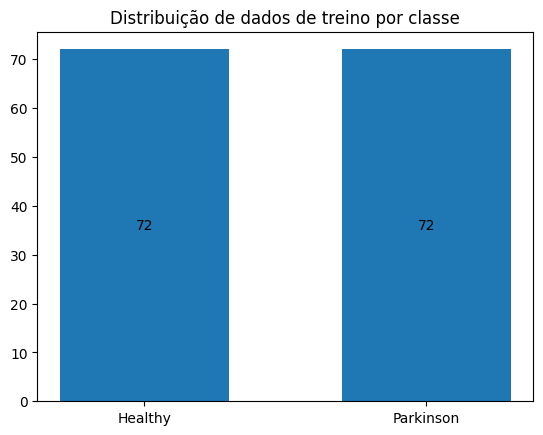

In [ ]:
dist = countClasses(y_train, [0,1])
classes = ['Healthy', 'Parkinson']

fig = plt.bar(classes, dist, width=0.6, label=classes)
plt.bar_label(fig, label_type='center')
plt.title('Distribuição de dados de treino por classe')

plt.show()

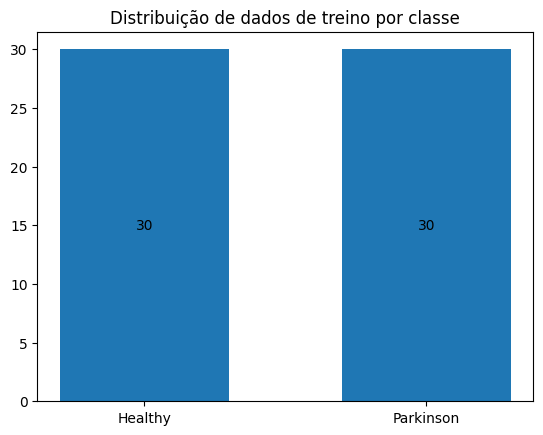

In [ ]:
dist = countClasses(y_test, [0,1])
classes = ['Healthy', 'Parkinson']

fig = plt.bar(classes, dist, width=0.6, label=classes)
plt.bar_label(fig, label_type='center')
plt.title('Distribuição de dados de treino por classe')

plt.show()

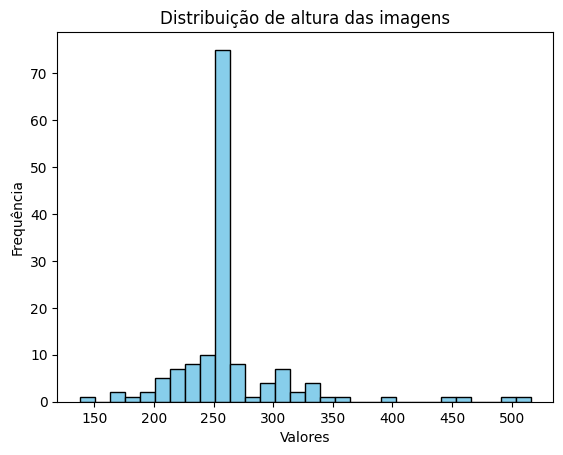

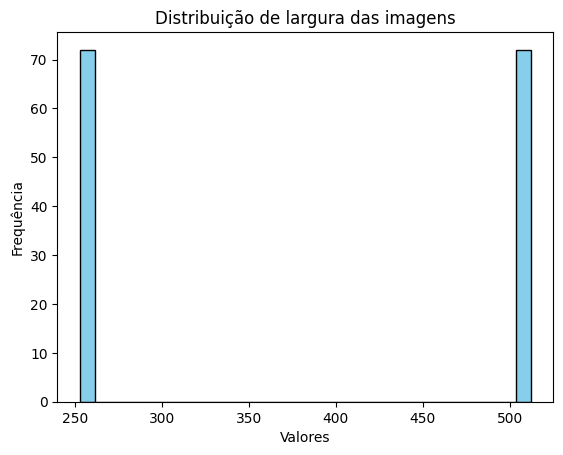

In [ ]:
height = [img.shape[0] for img in X_train or X_test]
width = [img.shape[1] for img in X_train or X_test]

unique_height = list(set(height))
unique_width = list(set(width))

dist_height = countClasses(height, unique_height)
dist_width = countClasses(width, unique_width)

plt.hist(height, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Valores')
plt.ylabel('Frequência')
plt.title('Distribuição de altura das imagens')

plt.show()

plt.hist(width, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Valores')
plt.ylabel('Frequência')
plt.title('Distribuição de largura das imagens')

plt.show()

### Augmentation

In [ ]:
X_train, y_train = augment(X_train, y_train)

X_train, y_train = shuffle(X_train, y_train, random_state=42)
X_test, y_test = shuffle(X_test, y_test, random_state=42)

print('train data size:',len(X_train),len(y_train))

train data size: 1152 1152


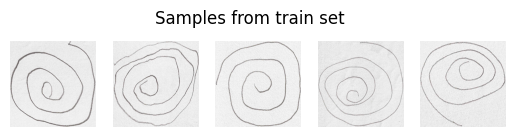

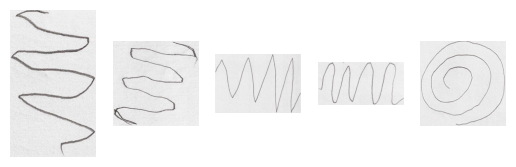

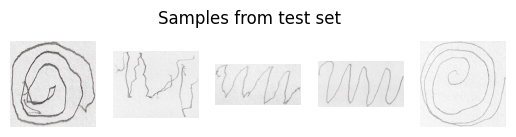

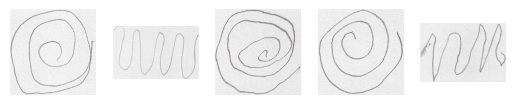

In [ ]:
title = "Samples from train set"
plotSamples(X_train, title)
title = "Samples from test set"
plotSamples(X_test, title)

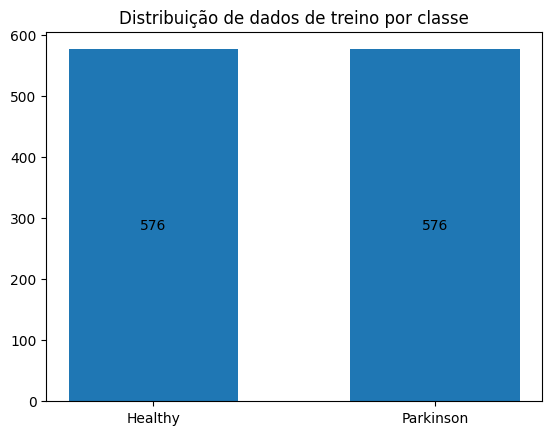

In [ ]:
dist = countClasses(y_train, [0,1])
classes = ['Healthy', 'Parkinson']

fig = plt.bar(classes, dist, width=0.6, label=classes)
plt.bar_label(fig, label_type='center')
plt.title('Distribuição de dados de treino por classe')

plt.show()

### Padding

In [ ]:
X_pd_train = resize_with_padding(X_train, [256,256])
X_pd_test = resize_with_padding(X_test, [256,256])

y_pd_train = y_train
y_pd_test = y_test

#for img in X_pd_train:
#  if img.shape != (256,256,3): print(img.shape)

print('train data size:',np.array(X_pd_train).shape)
print('test data size:',np.array(X_pd_test).shape)

train data size: (1152, 256, 256, 3)
test data size: (60, 256, 256, 3)


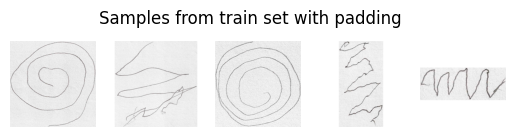

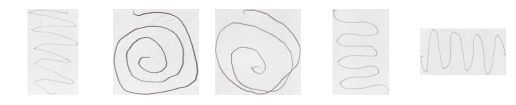

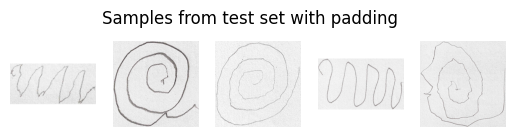

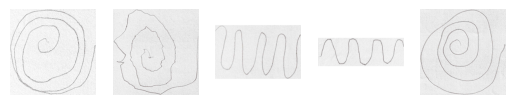

In [ ]:
title = "Samples from train set with padding"
plotSamples(X_pd_train, title)
title = "Samples from test set with padding"
plotSamples(X_pd_test, title)

In [ ]:
# Normalizando os dados# Normalizando os dados
X_pd_train = np.array(X_pd_train).astype('float32') / 255.0
X_pd_test = np.array(X_pd_test).astype('float32') / 255.0
y_pd_train = np.array(y_pd_train)
y_pd_test = np.array(y_pd_test)

### Resizing

In [ ]:
X_rs_train = resize(X_train, (256,256))
X_rs_test = resize(X_test, (256,256))

y_rs_train = y_train
y_rs_test = y_test

#for img in X_pd_train:
#  if img.shape != (256,256,3): print(img.shape)

print('train data size:',np.array(X_rs_train).shape)
print('test data size:',np.array(X_rs_test).shape)

train data size: (1152, 256, 256, 3)
test data size: (60, 256, 256, 3)


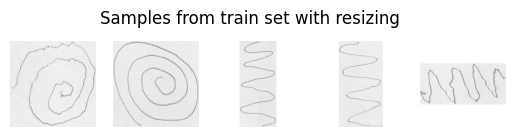

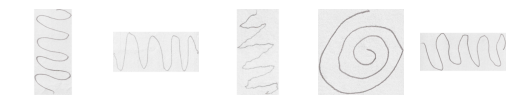

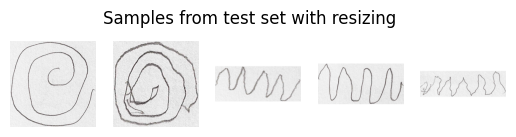

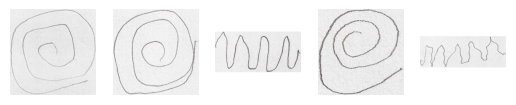

In [ ]:
title = "Samples from train set with resizing"
plotSamples(X_rs_train, title)
title = "Samples from test set with resizing"
plotSamples(X_rs_test, title)

In [ ]:
# Normalizando os dados
X_rs_train = np.array(X_rs_train).astype('float32') / 255.0
X_rs_test = np.array(X_rs_test).astype('float32') / 255.0
y_rs_train = np.array(y_rs_train)
y_rs_test = np.array(y_rs_test)

#DenseNet


In [ ]:
name = 'DenseNet'

# Configurando o modelo base
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base_model.trainable = True  # Descongelar todas as camadas para treinamento

modelDenseNet = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu'),
    layers.Dense(2, activation='softmax')
])

# Otimizador com taxa de aprendizado ajustada
opt = Adam(learning_rate=1e-4)
modelDenseNet.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
modelDenseNet.save_weights('densenet.h5')

## Inference

### Padded

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.6515 - accuracy: 0.7047

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 93s 1s/step - loss: 0.6515 - accuracy: 0.7047 - val_loss: 1.1674 - val_accuracy: 0.4805
Epoch 2/50
29/29 [==============================] - 14s 496ms/step - loss: 0.5124 - accuracy: 0.7763 - val_loss: 1.4864 - val_accuracy: 0.5368
Epoch 3/50
29/29 [==============================] - 13s 453ms/step - loss: 0.3137 - accuracy: 0.8871 - val_loss: 4.3267 - val_accuracy: 0.4892
Epoch 4/50
29/29 [==============================] - 17s 603ms/step - loss: 0.3335 - accuracy: 0.8567 - val_loss: 2.7913 - val_accuracy: 0.5541
Epoch 5/50
29/29 [==============================] - 13s 439ms/step - loss: 0.2119 - accuracy: 0.9218 - val_loss: 3.6806 - val_accuracy: 0.5325
Epoch 6/50
29/29 [==============================] - 18s 624ms/step - loss: 0.1831 - accuracy: 0.9251 - val_loss: 2.2346 - val_accuracy: 0.6494
Epoch 7/50
29/29 [==============================] - 21s 721ms/step - loss: 0.1909 - accuracy: 0.9229 - val_loss: 0.7139 - val_accuracy: 0.7100
Epoch 8/50
29

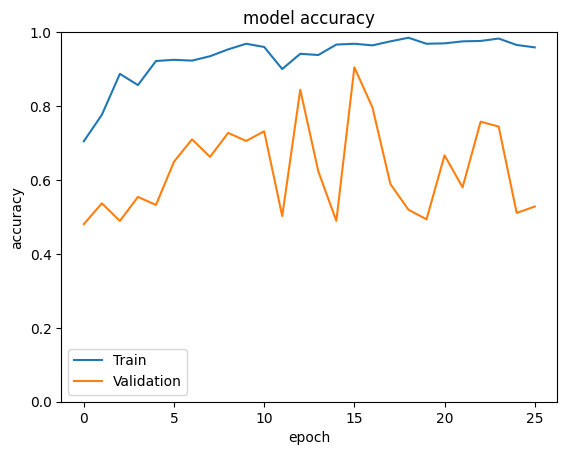

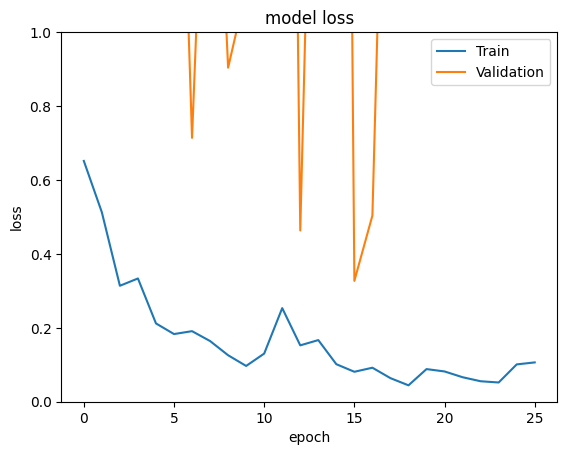

In [ ]:
train_dl_model(modelDenseNet, name, X_pd_train, y_pd_train)

2/2 [==============================] - 0s 112ms/step - loss: 0.2033 - accuracy: 0.9167
DenseNet Test Accuracy: 0.9167, DenseNet Test Loss: 0.2033

2/2 [==============================] - 2s 145ms/step

Classification Report do DenseNet
              precision    recall  f1-score   support

           0       0.90      0.93      0.92        30
           1       0.93      0.90      0.92        30

    accuracy                           0.92        60
   macro avg       0.92      0.92      0.92        60
weighted avg       0.92      0.92      0.92        60


TPR por classe do DenseNet: [0.9333 0.9   ]

Confusion Matrix


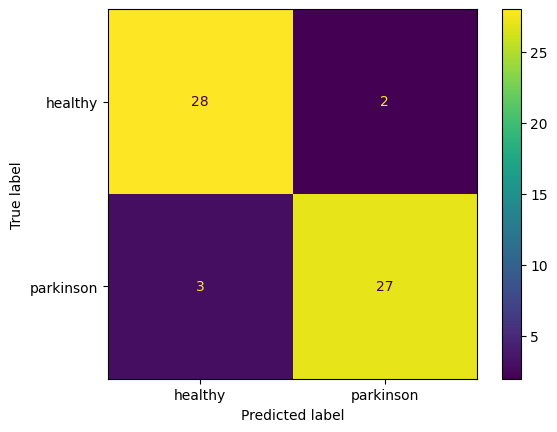

2/2 [==============================] - 0s 107ms/step

Curva AUC-ROC


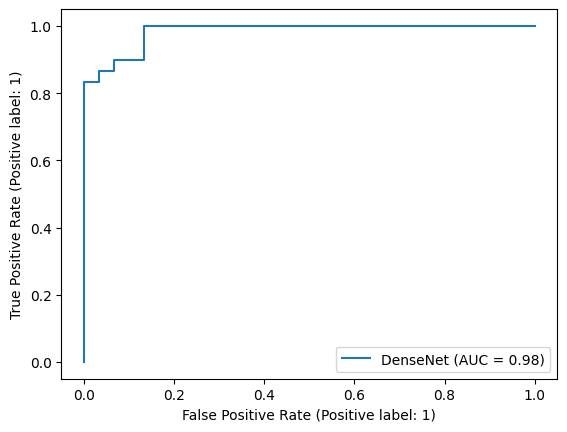

In [ ]:
modelDenseNet.load_weights('best_model.h5')
evaluate_dl_model(modelDenseNet, name, X_pd_test, y_pd_test, labels)

2/2 [==============================] - 0s 120ms/step


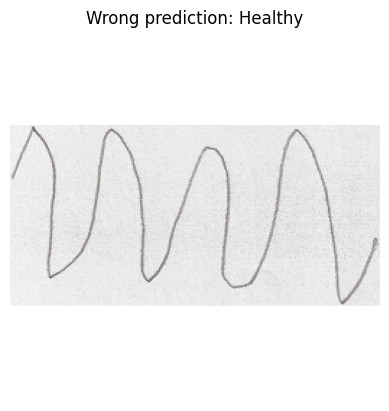

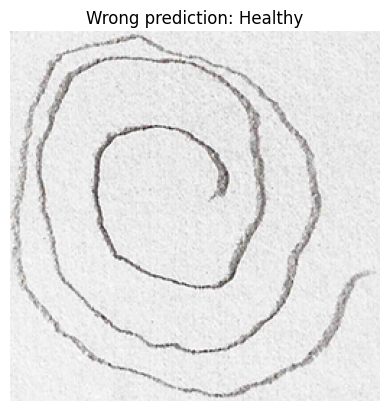

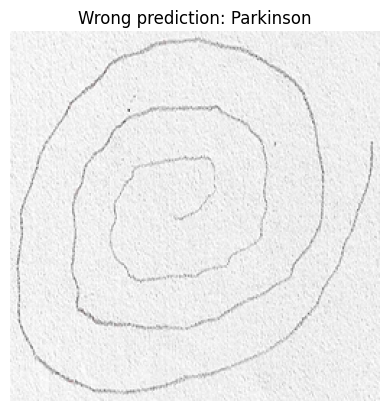

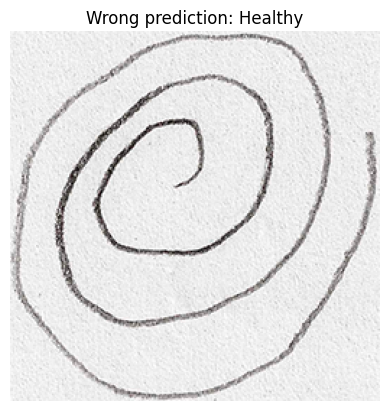

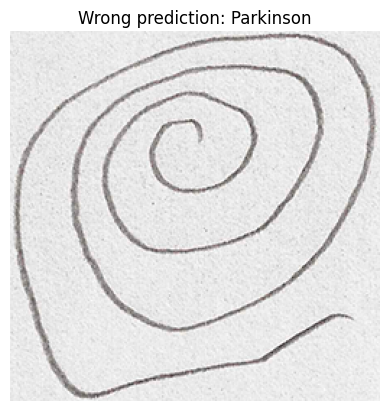

In [ ]:
plotMisclassed(X_pd_test, y_pd_test, modelDenseNet)

In [ ]:
modelDenseNet.load_weights('densenet.h5')

### Resized

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.6746 - accuracy: 0.6949

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 114s 1s/step - loss: 0.6746 - accuracy: 0.6949 - val_loss: 16.9792 - val_accuracy: 0.4892
Epoch 2/50
29/29 [==============================] - 13s 440ms/step - loss: 0.3831 - accuracy: 0.8426 - val_loss: 8.3010 - val_accuracy: 0.4892
Epoch 3/50
29/29 [==============================] - 14s 493ms/step - loss: 0.3961 - accuracy: 0.8480 - val_loss: 11.2032 - val_accuracy: 0.4978
Epoch 4/50
29/29 [==============================] - 14s 495ms/step - loss: 0.2587 - accuracy: 0.9066 - val_loss: 13.7927 - val_accuracy: 0.5281
Epoch 5/50
29/29 [==============================] - 15s 519ms/step - loss: 0.2600 - accuracy: 0.9055 - val_loss: 4.2432 - val_accuracy: 0.5628
Epoch 6/50
29/29 [==============================] - 15s 504ms/step - loss: 0.2192 - accuracy: 0.9001 - val_loss: 1.8507 - val_accuracy: 0.6450
Epoch 7/50
29/29 [==============================] - 15s 514ms/step - loss: 0.1627 - accuracy: 0.9392 - val_loss: 1.4909 - val_accuracy: 0.7056
Epoch 8/5

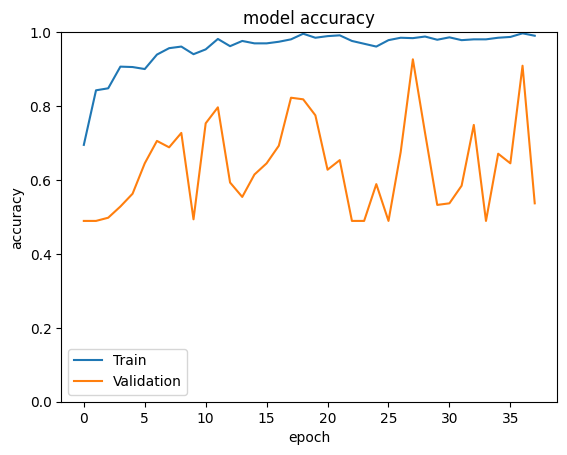

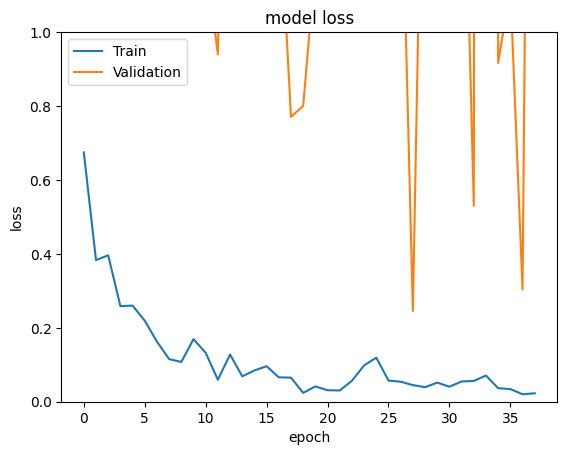

In [ ]:
train_dl_model(modelDenseNet, name, X_rs_train, y_rs_train)

2/2 [==============================] - 5s 5s/step - loss: 0.7685 - accuracy: 0.8500
DenseNet Test Accuracy: 0.85, DenseNet Test Loss: 0.7685

2/2 [==============================] - 2s 148ms/step

Classification Report do DenseNet
              precision    recall  f1-score   support

           0       0.78      0.97      0.87        30
           1       0.96      0.73      0.83        30

    accuracy                           0.85        60
   macro avg       0.87      0.85      0.85        60
weighted avg       0.87      0.85      0.85        60


TPR por classe do DenseNet: [0.9667 0.7333]

Confusion Matrix


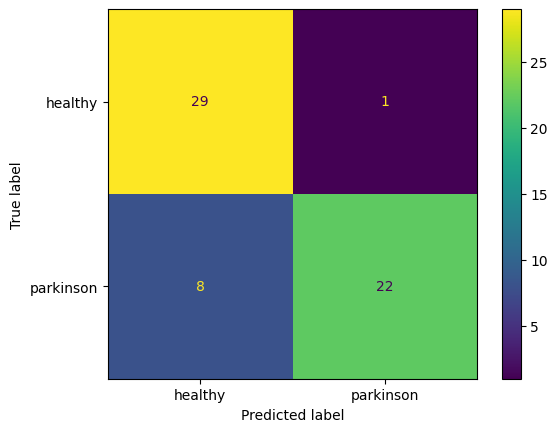

2/2 [==============================] - 0s 110ms/step

Curva AUC-ROC


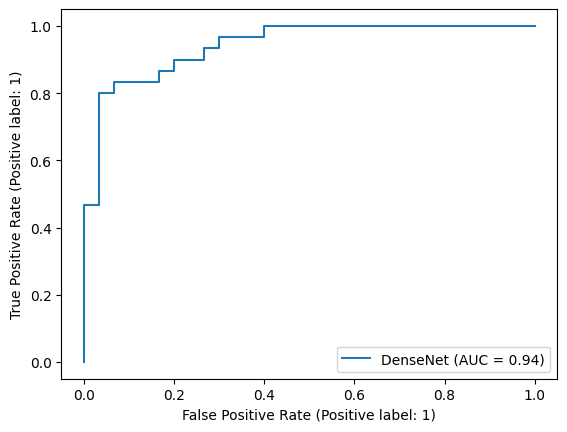

In [ ]:
modelDenseNet.load_weights('best_model.h5')
evaluate_dl_model(modelDenseNet, name, X_rs_test, y_rs_test, labels)

2/2 [==============================] - 0s 145ms/step


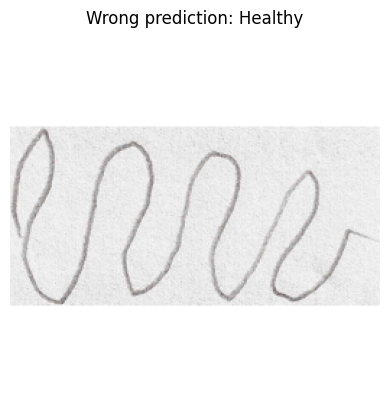

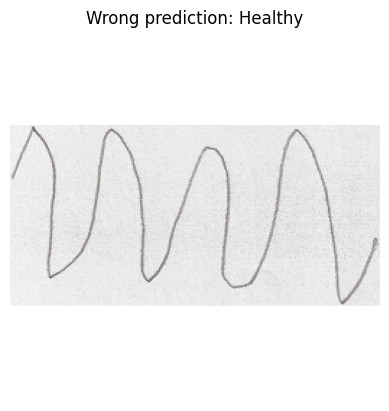

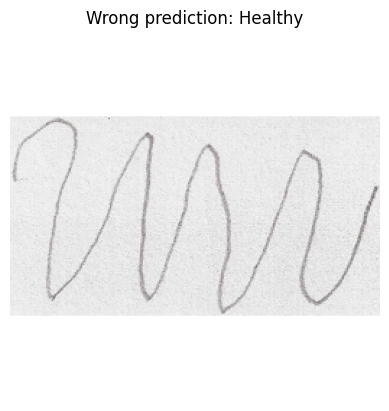

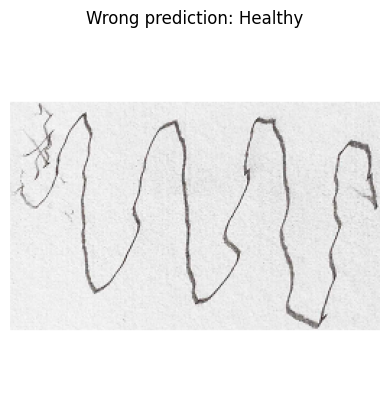

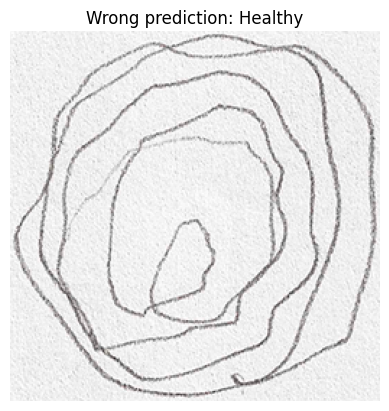

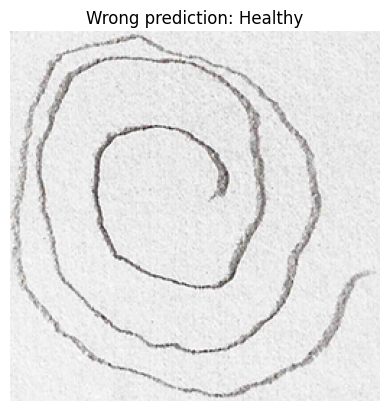

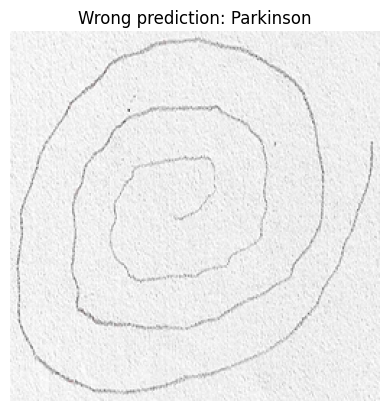

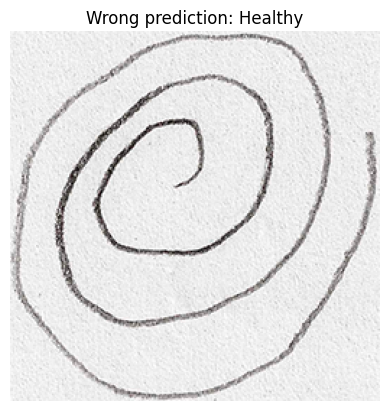

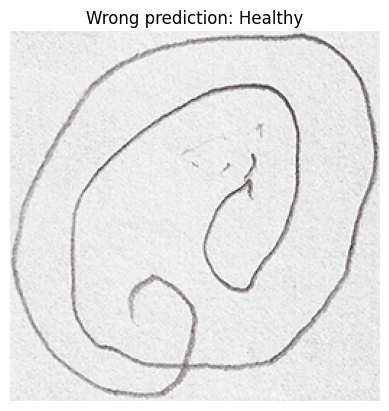

In [ ]:
plotMisclassed(X_rs_test, y_rs_test, modelDenseNet)

#ResNet


In [ ]:
name = 'ResNet'

# Configurando o modelo
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base_model.trainable = False  # Congelar a base do modelo

# Construção do novo modelo para o novo conjunto de classes
modelResNet = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu'),
    layers.Dense(2, activation='softmax')
])

# Compilar o modelo com as configurações de otimização e perda
opt = Adam(learning_rate=1e-4)
modelResNet.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
modelResNet.save_weights('resnet.h5')

## Inference

### Padded

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.8880 - accuracy: 0.5342

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 17s 356ms/step - loss: 0.8880 - accuracy: 0.5342 - val_loss: 0.6943 - val_accuracy: 0.5281
Epoch 2/50
29/29 [==============================] - 5s 179ms/step - loss: 0.7384 - accuracy: 0.5939 - val_loss: 0.6853 - val_accuracy: 0.5671
Epoch 3/50
29/29 [==============================] - 5s 170ms/step - loss: 0.7260 - accuracy: 0.6113 - val_loss: 0.6769 - val_accuracy: 0.5931
Epoch 4/50
29/29 [==============================] - 5s 162ms/step - loss: 0.6654 - accuracy: 0.6319 - val_loss: 0.7234 - val_accuracy: 0.5195
Epoch 5/50
29/29 [==============================] - 4s 152ms/step - loss: 0.6431 - accuracy: 0.6547 - val_loss: 0.6851 - val_accuracy: 0.5325
Epoch 6/50
29/29 [==============================] - 5s 162ms/step - loss: 0.6498 - accuracy: 0.6341 - val_loss: 0.7793 - val_accuracy: 0.4762
Epoch 7/50
29/29 [==============================] - 5s 162ms/step - loss: 0.5999 - accuracy: 0.6797 - val_loss: 0.7362 - val_accuracy: 0.4805
Epoch 8/50
29/29

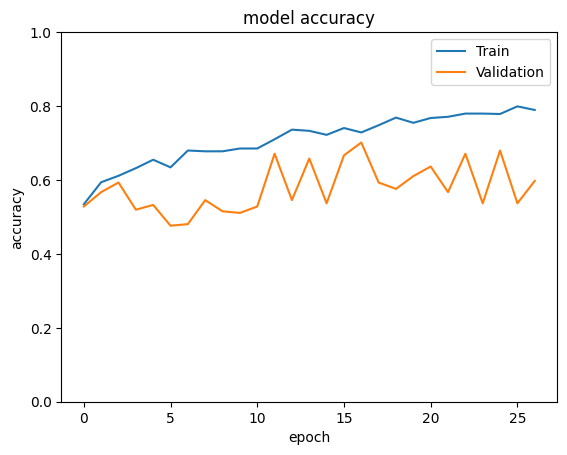

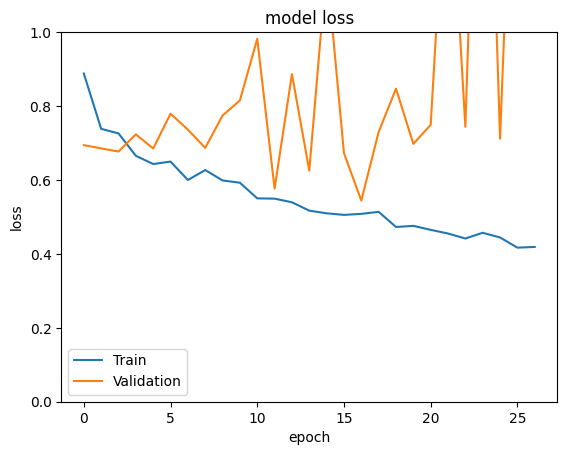

In [ ]:
train_dl_model(modelResNet, name, X_pd_train, y_pd_train)

2/2 [==============================] - 2s 2s/step - loss: 0.5654 - accuracy: 0.6667
ResNet Test Accuracy: 0.6667, ResNet Test Loss: 0.5654

2/2 [==============================] - 1s 102ms/step

Classification Report do ResNet
              precision    recall  f1-score   support

           0       0.81      0.43      0.57        30
           1       0.61      0.90      0.73        30

    accuracy                           0.67        60
   macro avg       0.71      0.67      0.65        60
weighted avg       0.71      0.67      0.65        60


TPR por classe do ResNet: [0.4333 0.9   ]

Confusion Matrix


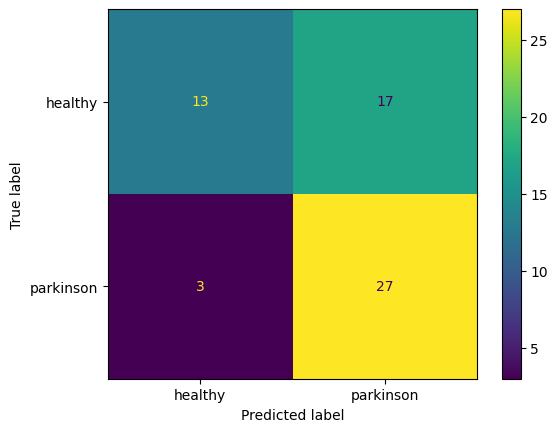

2/2 [==============================] - 0s 114ms/step

Curva AUC-ROC


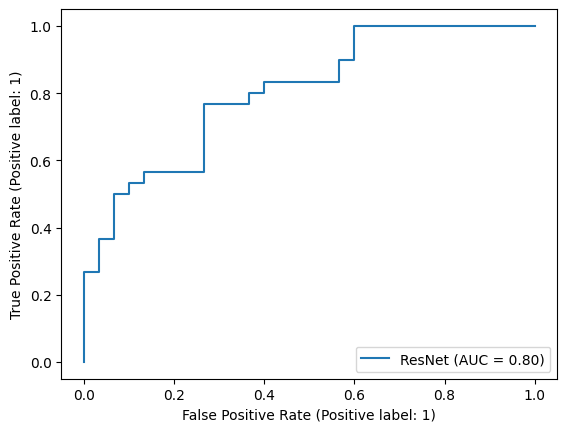

In [ ]:
modelResNet.load_weights('best_model.h5')
evaluate_dl_model(modelResNet, name, X_pd_test, y_pd_test, labels)

2/2 [==============================] - 0s 149ms/step


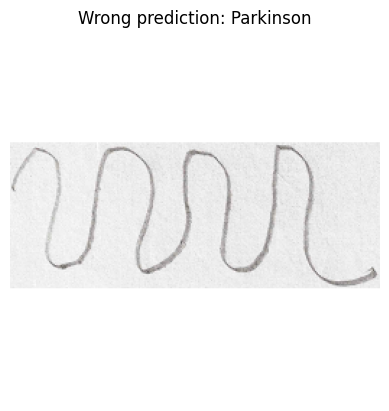

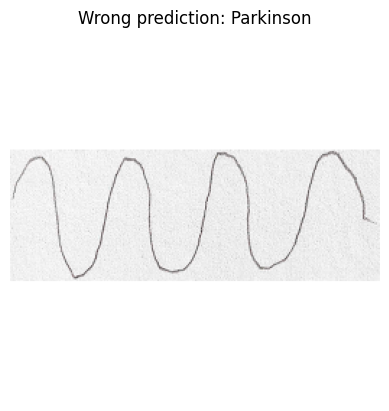

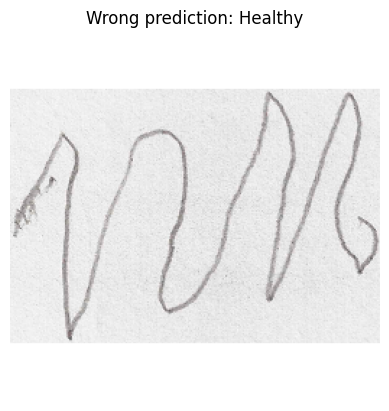

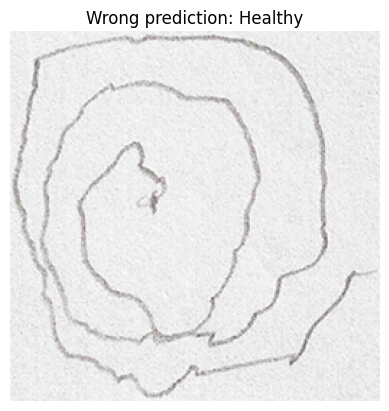

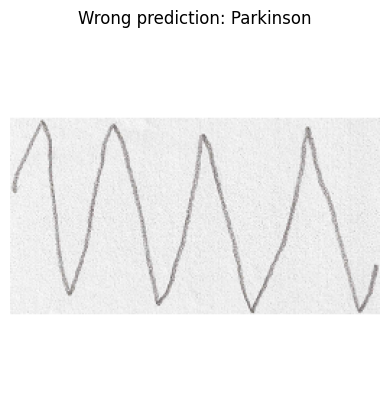

...

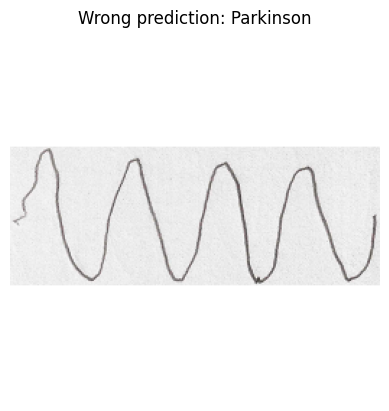

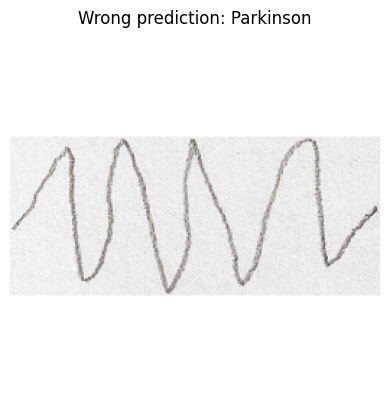

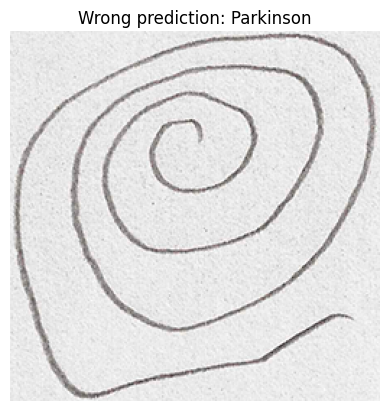

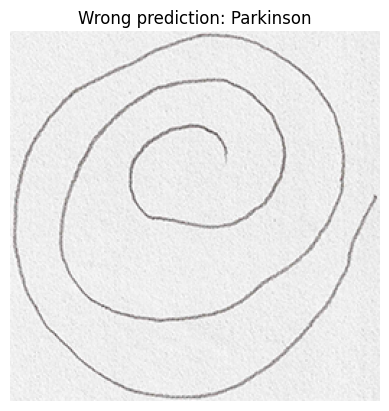

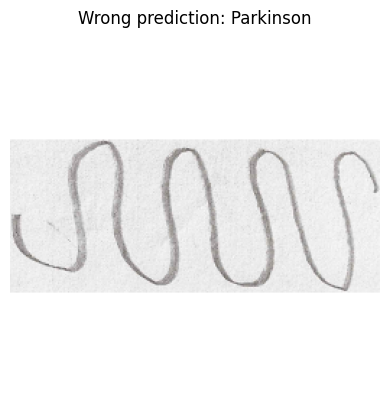

In [ ]:
plotMisclassed(X_pd_test, y_pd_test, modelResNet)

In [ ]:
modelResNet.load_weights('resnet.h5')

### Resized

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.9281 - accuracy: 0.5364

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 11s 234ms/step - loss: 0.9281 - accuracy: 0.5364 - val_loss: 0.7243 - val_accuracy: 0.5108
Epoch 2/50
29/29 [==============================] - 5s 168ms/step - loss: 0.7318 - accuracy: 0.6069 - val_loss: 0.7002 - val_accuracy: 0.5108
Epoch 3/50
29/29 [==============================] - 5s 183ms/step - loss: 0.7036 - accuracy: 0.5983 - val_loss: 0.6750 - val_accuracy: 0.5368
Epoch 4/50
29/29 [==============================] - 5s 174ms/step - loss: 0.6845 - accuracy: 0.6341 - val_loss: 0.7030 - val_accuracy: 0.5541
Epoch 5/50
29/29 [==============================] - 4s 143ms/step - loss: 0.6388 - accuracy: 0.6363 - val_loss: 0.7591 - val_accuracy: 0.4892
Epoch 6/50
29/29 [==============================] - 5s 183ms/step - loss: 0.6708 - accuracy: 0.6352 - val_loss: 0.6699 - val_accuracy: 0.5887
Epoch 7/50
29/29 [==============================] - 5s 188ms/step - loss: 0.6169 - accuracy: 0.6417 - val_loss: 0.6531 - val_accuracy: 0.6147
Epoch 8/50
29/29

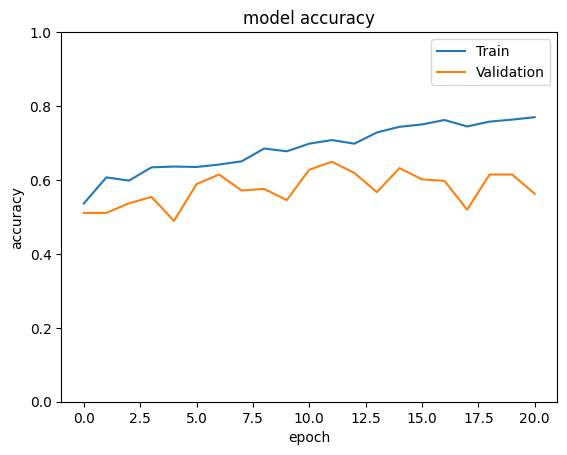

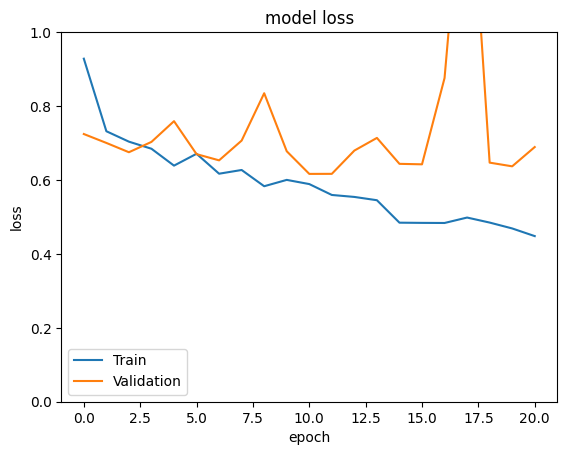

In [ ]:
train_dl_model(modelResNet, name, X_rs_train, y_rs_train)

2/2 [==============================] - 0s 111ms/step - loss: 0.6213 - accuracy: 0.6000
ResNet Test Accuracy: 0.6, ResNet Test Loss: 0.6213

2/2 [==============================] - 1s 104ms/step

Classification Report do ResNet
              precision    recall  f1-score   support

           0       1.00      0.20      0.33        30
           1       0.56      1.00      0.71        30

    accuracy                           0.60        60
   macro avg       0.78      0.60      0.52        60
weighted avg       0.78      0.60      0.52        60


TPR por classe do ResNet: [0.2 1. ]

Confusion Matrix


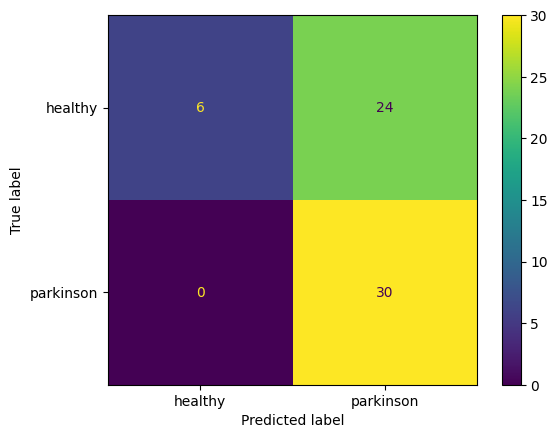

2/2 [==============================] - 0s 103ms/step

Curva AUC-ROC


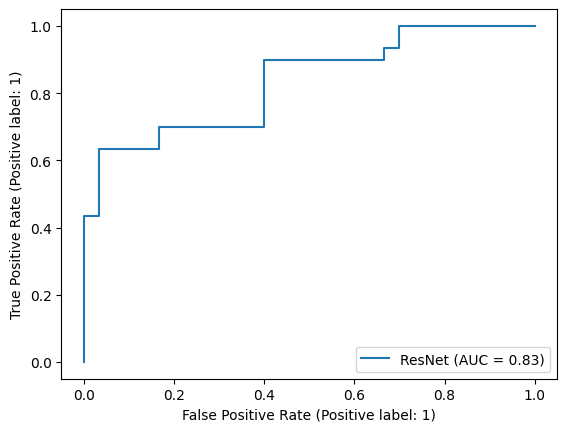

In [ ]:
modelResNet.load_weights('best_model.h5')
evaluate_dl_model(modelResNet, name, X_rs_test, y_rs_test, labels)

2/2 [==============================] - 0s 150ms/step


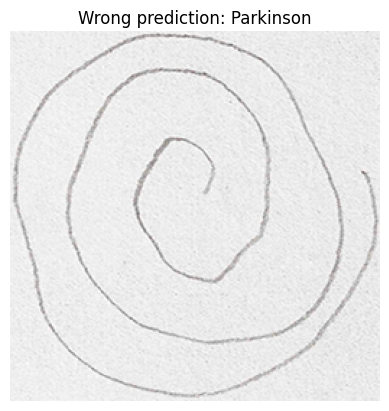

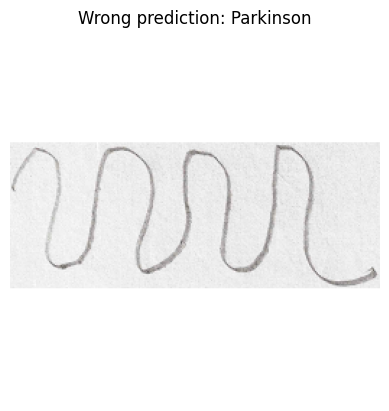

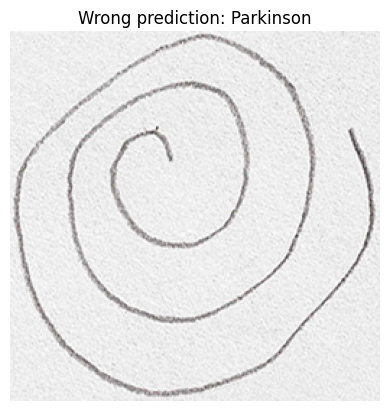

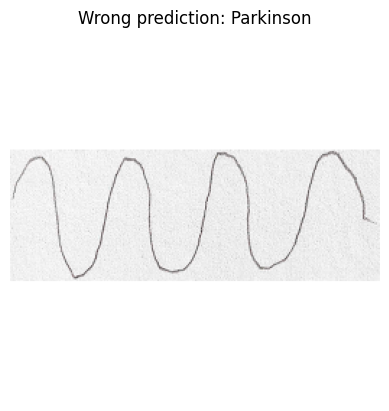

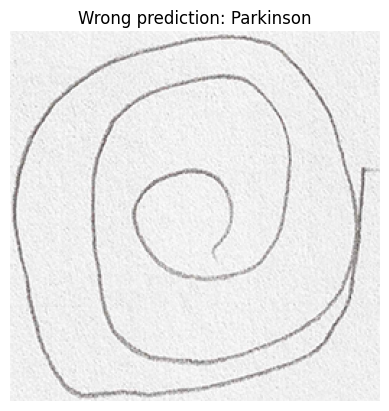

...

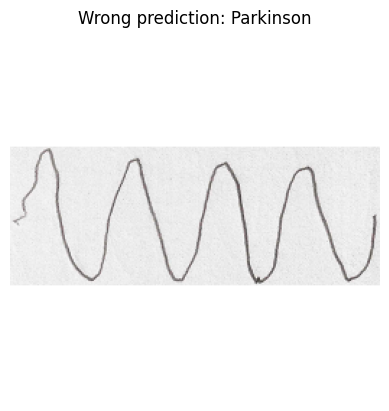

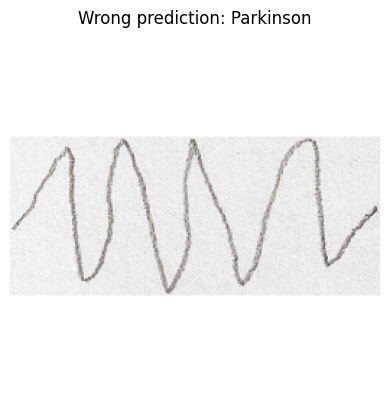

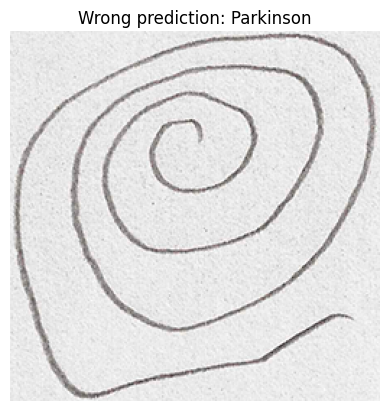

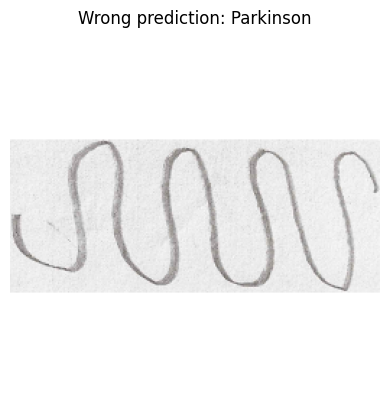

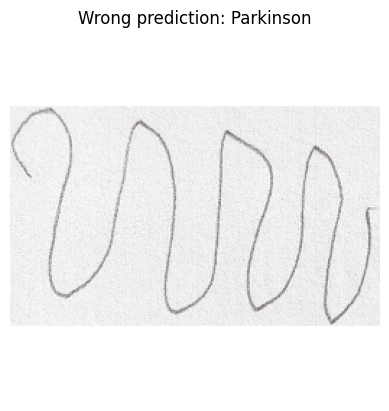

In [ ]:
plotMisclassed(X_rs_test, y_rs_test, modelResNet)

#VGG


In [ ]:
name = "VGG"


# Configurando o modelo base VGG16 com pesos pré-treinados
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base_model.trainable = False  # Congelar a base do modelo

# Construção do novo modelo para o novo conjunto de classes
modelVGG = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax')
])

# Compilar o modelo com as configurações de otimização e perda
opt = Adam(learning_rate=1e-4)
modelResNet.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
modelVGG.save_weights('vgg16.h5')

## Inference

### Padded

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.7453 - accuracy: 0.7242

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 24s 515ms/step - loss: 0.7453 - accuracy: 0.7242 - val_loss: 0.6351 - val_accuracy: 0.5281
Epoch 2/50
29/29 [==============================] - 6s 208ms/step - loss: 0.5045 - accuracy: 0.7894 - val_loss: 0.5693 - val_accuracy: 0.7446
Epoch 3/50
29/29 [==============================] - 6s 193ms/step - loss: 0.4357 - accuracy: 0.8046 - val_loss: 0.5877 - val_accuracy: 0.6797
Epoch 4/50
29/29 [==============================] - 6s 208ms/step - loss: 0.4613 - accuracy: 0.8056 - val_loss: 0.5160 - val_accuracy: 0.8052
Epoch 5/50
29/29 [==============================] - 6s 210ms/step - loss: 0.4617 - accuracy: 0.8067 - val_loss: 0.4668 - val_accuracy: 0.8528
Epoch 6/50
29/29 [==============================] - 6s 208ms/step - loss: 0.3661 - accuracy: 0.8404 - val_loss: 0.4275 - val_accuracy: 0.8571
Epoch 7/50
29/29 [==============================] - 6s 211ms/step - loss: 0.2926 - accuracy: 0.8654 - val_loss: 0.3898 - val_accuracy: 0.8745
Epoch 8/50
29/29

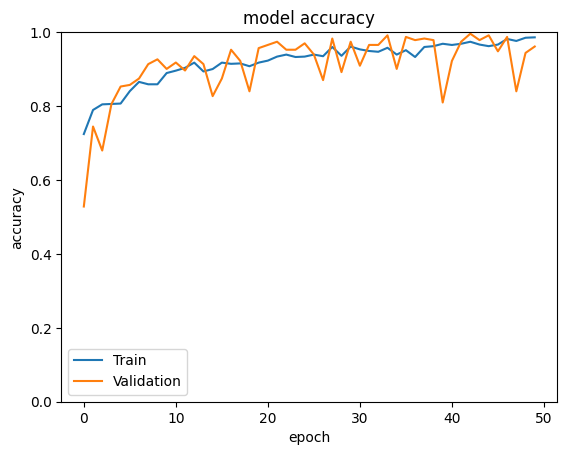

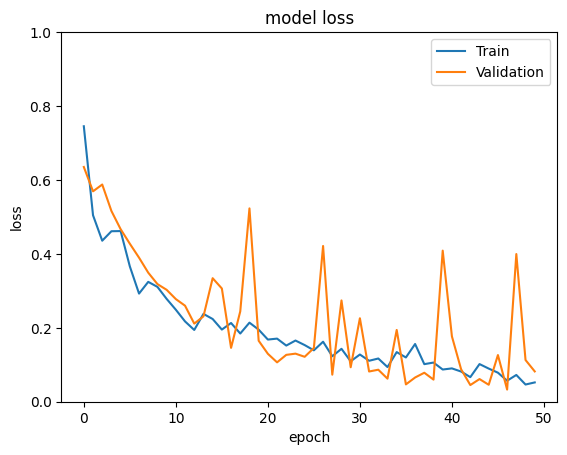

In [ ]:
train_dl_model(modelVGG, name, X_pd_train, y_pd_train)

2/2 [==============================] - 7s 7s/step - loss: 0.5956 - accuracy: 0.8500
VGG Test Accuracy: 0.85, VGG Test Loss: 0.5956

2/2 [==============================] - 0s 200ms/step

Classification Report do VGG
              precision    recall  f1-score   support

           0       0.86      0.83      0.85        30
           1       0.84      0.87      0.85        30

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60


TPR por classe do VGG: [0.8333 0.8667]

Confusion Matrix


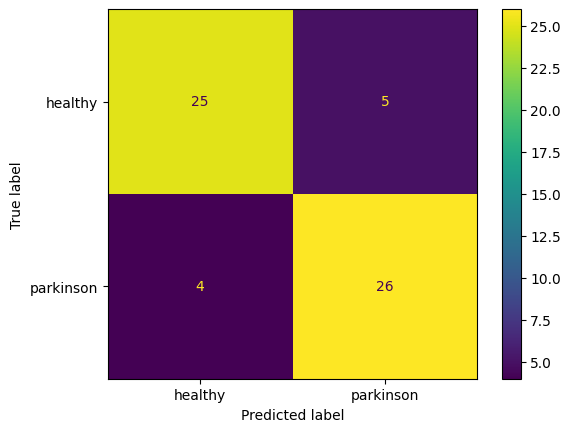

2/2 [==============================] - 0s 145ms/step

Curva AUC-ROC


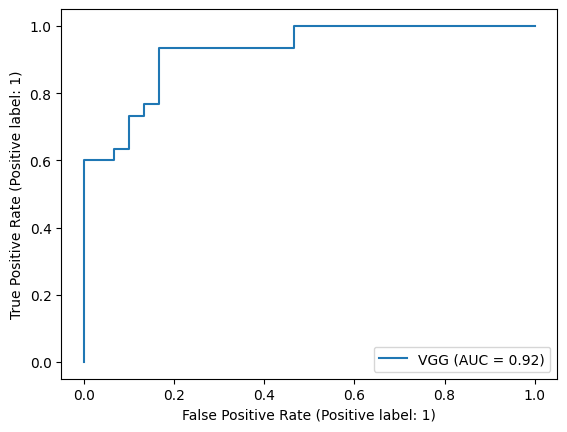

In [ ]:
modelVGG.load_weights('best_model.h5')
evaluate_dl_model(modelVGG, name, X_pd_test, y_pd_test, labels)

2/2 [==============================] - 0s 186ms/step


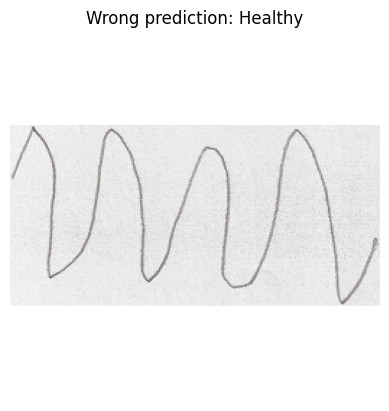

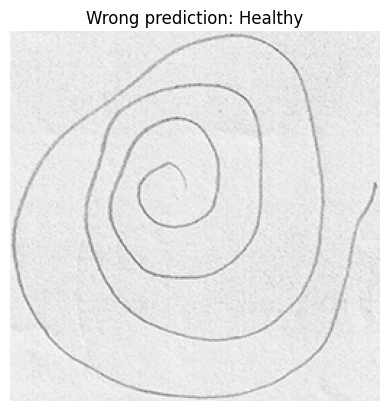

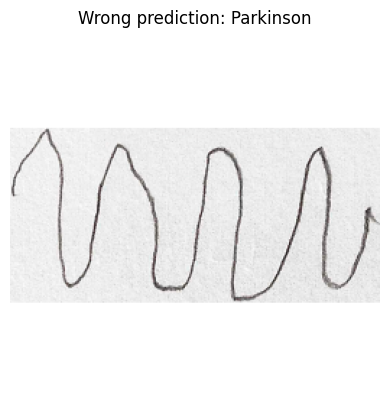

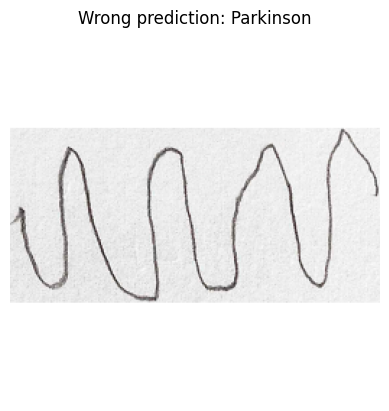

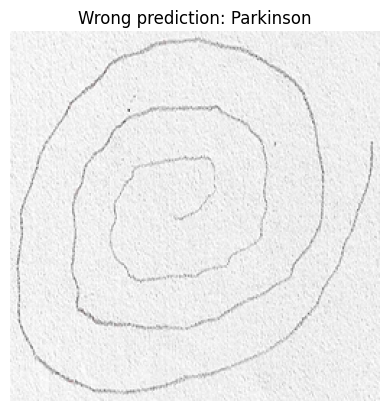

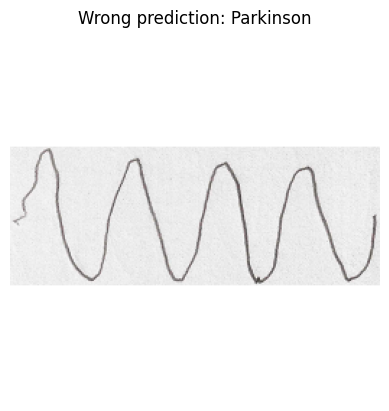

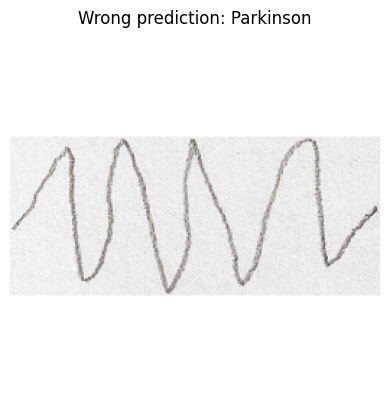

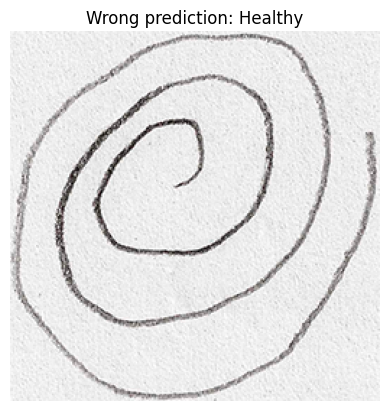

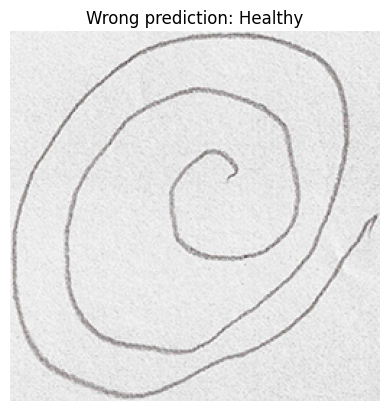

In [ ]:
plotMisclassed(X_pd_test, y_pd_test, modelVGG)

In [ ]:
modelVGG.load_weights('vgg16.h5')

### Resized

Epoch 1/50
29/29 [==============================] - ETA: 0s - loss: 0.7470 - accuracy: 0.7123

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 9s 237ms/step - loss: 0.7470 - accuracy: 0.7123 - val_loss: 0.6238 - val_accuracy: 0.6147
Epoch 2/50
29/29 [==============================] - 6s 214ms/step - loss: 0.5655 - accuracy: 0.7687 - val_loss: 0.5963 - val_accuracy: 0.6450
Epoch 3/50
29/29 [==============================] - 6s 209ms/step - loss: 0.4605 - accuracy: 0.8089 - val_loss: 0.5553 - val_accuracy: 0.7619
Epoch 4/50
29/29 [==============================] - 6s 206ms/step - loss: 0.4222 - accuracy: 0.8295 - val_loss: 0.5023 - val_accuracy: 0.8571
Epoch 5/50
29/29 [==============================] - 6s 203ms/step - loss: 0.3818 - accuracy: 0.8208 - val_loss: 0.4739 - val_accuracy: 0.8312
Epoch 6/50
29/29 [==============================] - 6s 218ms/step - loss: 0.3399 - accuracy: 0.8426 - val_loss: 0.4397 - val_accuracy: 0.9048
Epoch 7/50
29/29 [==============================] - 6s 207ms/step - loss: 0.3031 - accuracy: 0.8730 - val_loss: 0.3877 - val_accuracy: 0.8701
Epoch 8/50
29/29 

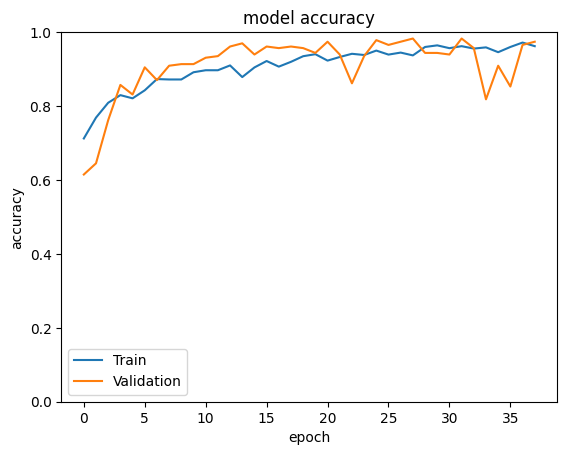

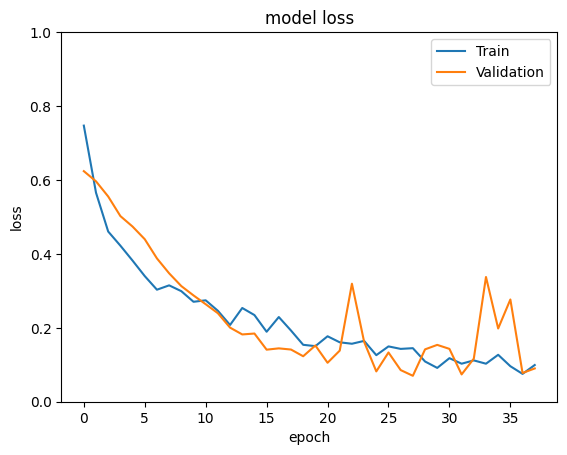

In [ ]:
train_dl_model(modelVGG, name, X_rs_train, y_rs_train)

2/2 [==============================] - 0s 158ms/step - loss: 0.4236 - accuracy: 0.8667
VGG Test Accuracy: 0.8667, VGG Test Loss: 0.4236

2/2 [==============================] - 0s 153ms/step

Classification Report do VGG
              precision    recall  f1-score   support

           0       0.89      0.83      0.86        30
           1       0.84      0.90      0.87        30

    accuracy                           0.87        60
   macro avg       0.87      0.87      0.87        60
weighted avg       0.87      0.87      0.87        60


TPR por classe do VGG: [0.8333 0.9   ]

Confusion Matrix


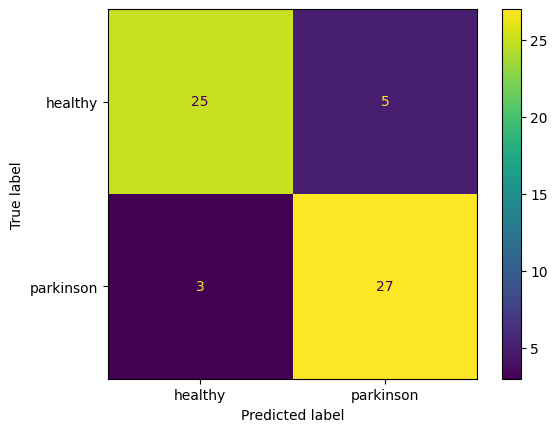

2/2 [==============================] - 0s 149ms/step

Curva AUC-ROC


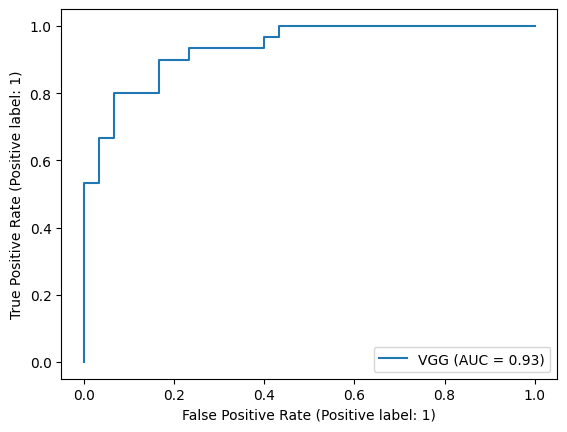

In [ ]:
modelVGG.load_weights('best_model.h5')
evaluate_dl_model(modelVGG, name, X_rs_test, y_rs_test, labels)

2/2 [==============================] - 0s 201ms/step


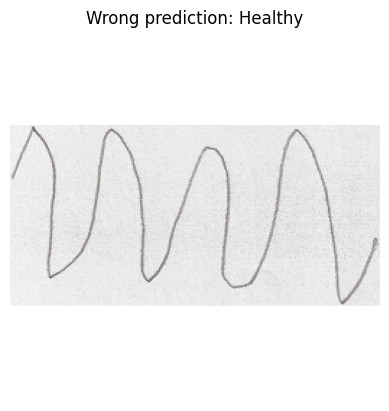

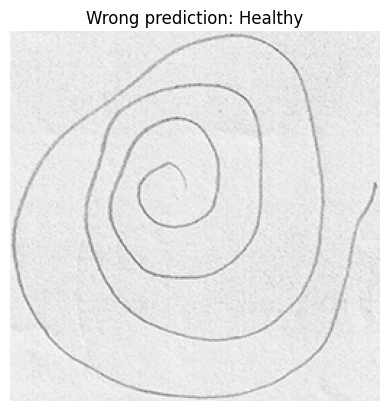

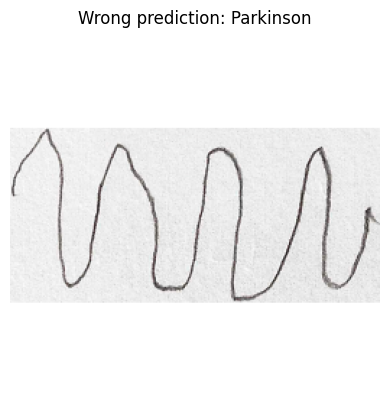

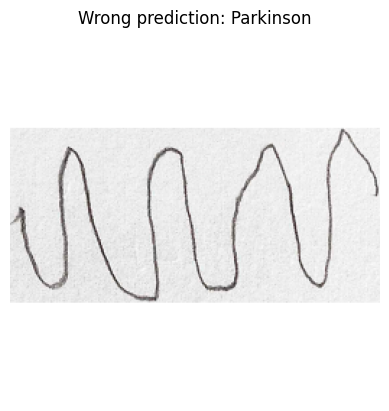

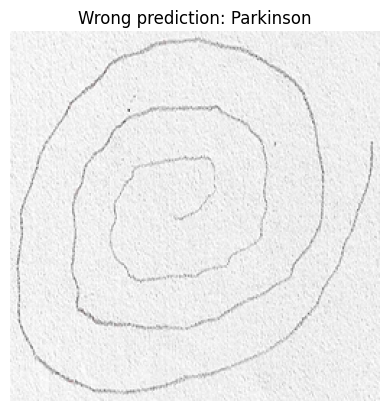

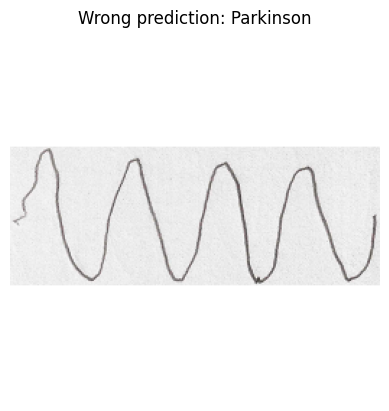

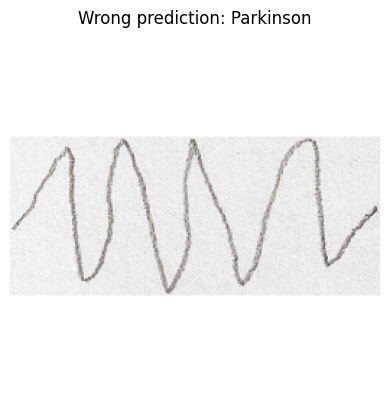

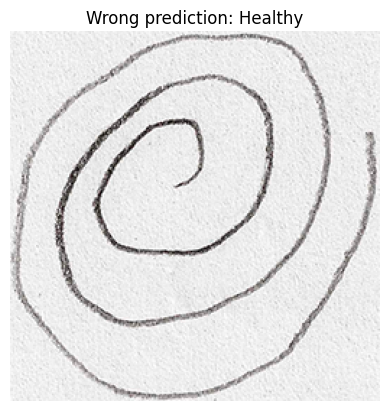

In [ ]:
plotMisclassed(X_rs_test, y_rs_test, modelVGG)

#Análise Comparativa

In [ ]:
# Organizando os dados
data = {
    'Modelos/Dados': ['DenseNet/Padding', 'DenseNet/Resizing', 'ResNet/Padding', 'ResNet/Resizing', 'VGG/Padding', 'VGG/Resizing'],
    'Acurácia': [0.92, 0.85, 0.67, 0.6, 0.85, 0.87],
    'Precisão': [(0.9,0.93), (0.78,0.96), (0.81,0.61), (1.0,0.56), (0.86,0.84), (0.89,0.84)],
    'Recall': [(0.93,0.9), (0.97,0.73), (0.43,0.9), (0.2,1.0), (0.83,0.87), (0.83,0.9)],
    'F1-score': [(0.92,0.92), (0.87,0.83), (0.57,0.73), (0.33,0.71), (0.85,0.85), (0.86,0.87)]
}

# Comparando piores classes e resultados
print('Resultados por modelo/conjunto de dados')
print(tabulate(data, headers='keys', tablefmt='outline'))

Resultados por modelo/conjunto de dados
+-------------------+------------+--------------+--------------+--------------+
| Modelos/Dados     |   Acurácia | Precisão     | Recall       | F1-score     |
+===================+============+==============+==============+==============+
| DenseNet/Padding  |       0.92 | (0.9, 0.93)  | (0.93, 0.9)  | (0.92, 0.92) |
| DenseNet/Resizing |       0.85 | (0.78, 0.96) | (0.97, 0.73) | (0.87, 0.83) |
| ResNet/Padding    |       0.67 | (0.81, 0.61) | (0.43, 0.9)  | (0.57, 0.73) |
| ResNet/Resizing   |       0.6  | (1.0, 0.56)  | (0.2, 1.0)   | (0.33, 0.71) |
| VGG/Padding       |       0.85 | (0.86, 0.84) | (0.83, 0.87) | (0.85, 0.85) |
| VGG/Resizing      |       0.87 | (0.89, 0.84) | (0.83, 0.9)  | (0.86, 0.87) |
+-------------------+------------+--------------+--------------+--------------+
